In [1]:
import re
import numpy as np
import pandas as pd
from glob import glob
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib.font_manager as fm
from pyecharts.globals import CurrentConfig, NotebookType,ThemeType

CurrentConfig.NOTEBOOK_TYPE = NotebookType.JUPYTER_LAB

# 查看系统可用的中文字体
def show_chinese_fonts():
    """显示系统中可用的中文字体"""
    fonts = [f.name for f in fm.fontManager.ttflist if 'Hei' in f.name or 'Song' in f.name or 'Kai' in f.name]
    print("可用的中文字体:")
    for font in set(fonts):
        print(f"  - {font}")
    return list(set(fonts))

fonts = show_chinese_fonts()
plt.rcParams['font.sans-serif'] = ['SimSong']
plt.rcParams['axes.unicode_minus'] = False


可用的中文字体:
  - Kai
  - Kaiti SC
  - Songti SC
  - LiSong Pro
  - Heiti TC
  - SimSong
  - Hei
  - Noto Sans Kaithi
  - BiauKaiHK
  - STHeiti
  - LiHei Pro
  - Kailasa


In [3]:
df = pd.read_csv("data/result.csv")
df['rate'] = df['环比'].apply(lambda x: float(x)/100)
df2 = pd.pivot(df,values='rate',index='月份',columns='城市')
df2.columns=[''.join(v for v in name if v.strip()) for name in df2.columns]
df2 = df2.cumprod(axis=0)
data0 = pd.concat([pd.DataFrame([[1]*len(df2.columns)],columns=df2.columns,index=["1712"]), df2])
data0

,三亚,上海,丹东,乌鲁木齐,九江,兰州,包头,北京,北海,南京,...,遵义,郑州,重庆,金华,银川,锦州,长春,长沙,青岛,韶关
1712,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000
1801,1.009000,0.996000,1.001000,1.004000,1.005000,1.004000,1.008000,1.002000,0.997000,0.997000,...,1.011000,0.997000,1.003000,1.002000,1.004000,1.004000,1.007000,1.004000,1.001000,0.995000
1802,1.019090,0.994008,0.998998,1.017052,1.009020,1.009020,1.012032,0.998994,1.000988,0.996003,...,1.017066,0.997000,1.006009,1.002000,1.009020,1.012032,1.007000,1.006008,1.001000,0.997985
1803,1.026224,0.995996,1.002994,1.025188,1.014065,1.013056,1.018104,0.999993,1.008996,0.993015,...,1.026220,0.996003,1.013051,1.005006,1.017092,1.021140,1.017070,1.009026,1.005004,1.003973
1804,1.045722,0.995000,1.023054,1.036465,1.016093,1.018121,1.024213,1.001993,1.017068,0.991029,...,1.034429,1.000983,1.024195,1.018071,1.023195,1.028288,1.026224,1.011044,1.006009,1.007989
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2506,1.332916,1.323523,1.176425,1.176791,1.093511,1.066264,1.023589,1.166501,0.965070,1.042295,...,1.123573,0.989568,1.312114,1.023391,1.446333,1.216125,1.124441,1.315250,1.202176,0.924709
2507,1.335582,1.327493,1.174072,1.180321,1.090230,1.058800,1.017447,1.166501,0.959279,1.037084,...,1.122449,0.983630,1.305554,1.020321,1.439101,1.212477,1.125565,1.309989,1.197368,0.923784
2508,1.331576,1.332803,1.169376,1.181502,1.088050,1.054564,1.008290,1.161835,0.954483,1.030861,...,1.116837,0.979696,1.296415,1.019301,1.436223,1.210052,1.123314,1.306059,1.193775,0.921937
2509,1.331576,1.336802,1.165868,1.179139,1.078257,1.051401,0.998207,1.164159,0.947802,1.024676,...,1.112370,0.973818,1.291229,1.016243,1.427605,1.208842,1.124438,1.300835,1.187807,0.921015


In [4]:
import json

with open("data/city-map.json","r") as fp:
    cities = json.load(fp)

data1 = data0[cities["一线"]]
data2 = data0[cities["二线"]]
data3 = data0[cities["三线"]]
data1

,北京,上海,广州,深圳
1712,1.000000,1.000000,1.000000,1.000000
1801,1.002000,0.996000,0.996000,1.000000
1802,0.998994,0.994008,0.992016,0.994000
1803,0.999993,0.995996,0.994000,0.993006
1804,1.001993,0.995000,0.993006,0.993999
...,...,...,...,...
2506,1.166501,1.323523,1.088199,1.004959
2507,1.166501,1.327493,1.084934,0.998929
2508,1.161835,1.332803,1.082764,0.994933
2509,1.164159,1.336802,1.076267,0.984984


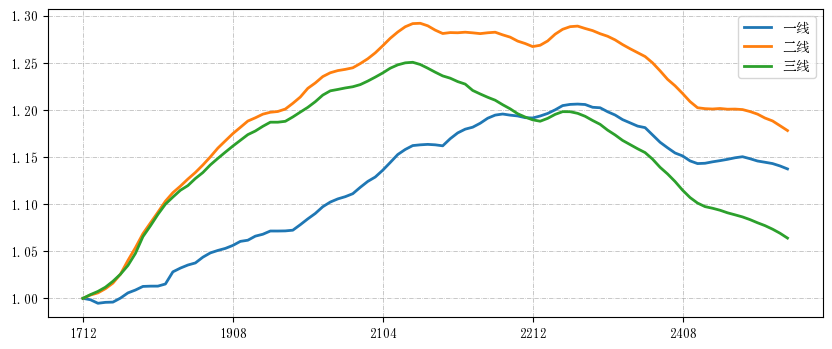

In [14]:
data01 = pd.DataFrame(index=data1.index,columns=["一线","二线","三线"])
data01["一线"] = data1.mean(axis=1)
data01["二线"] = data2.mean(axis=1)
data01["三线"] = data3.mean(axis=1)

fig, ax = plt.subplots(figsize=(10, 4))
data01.plot(ax=ax, linewidth=2)
ax.grid(True, color='gray', linestyle='-.', linewidth=0.5, alpha=0.6)

In [4]:
from pyecharts.charts import Line
import pyecharts.options as opts

c=(
    Line(init_opts=opts.InitOpts(width="80vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月", type_="category"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
for name in df2.columns:
    last_value = df2[name].values[-1]
    c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=True),linestyle_opts=opts.LineStyleOpts(opacity=1, width=2))
c.load_javascript()

In [5]:
c.render_notebook()

In [6]:
from pyecharts.charts import Line
import pyecharts.options as opts

c=(
    Line(init_opts=opts.InitOpts(width="80vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月", type_="category"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
# 前五和后五
top5 = df2.iloc[-1,:].sort_values(ascending=False)[:5]
print("前五名\n-------------")
print(top5)
bottom5 = df2.iloc[-1,:].sort_values(ascending=True)[:5]
print("后五名\n-------------")
print(bottom5)

for name in df2.columns:
    if name in top5.index:
        c.add_yaxis(name, df2[name], is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='triangle',symbol_size=10,linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=0.8, width=3))
    elif name in bottom5.index:
        c.add_yaxis(name, df2[name], is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='circle',symbol_size=10,linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=0.6, width=2))
    else:
        c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=False),linestyle_opts=opts.LineStyleOpts(opacity=0.2, width=1))
c.load_javascript()

前五名
-------------
西安    1.606839
成都    1.489377
银川    1.421895
上海    1.340812
杭州    1.340129
Name: 2510, dtype: float64
后五名
-------------
岳阳    0.846536
泸州    0.880787
常德    0.903041
温州    0.905075
安庆    0.919886
Name: 2510, dtype: float64


In [7]:
c.render_notebook()

In [8]:
from pyecharts.charts import Line
import pyecharts.options as opts

c=(
    Line(init_opts=opts.InitOpts(width="60vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月", type_="category"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
for name in df2.columns:
    last_value = df2[name].values[-1]
    if name in ["北京","上海","广州","深圳"]:
        c.add_yaxis(name, df2[name], is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='circle',symbol_size=10, linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=1, width=3))
    else:
        c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=False),linestyle_opts=opts.LineStyleOpts(opacity=0.2, width=1))
c.load_javascript()

In [9]:
c.render_notebook()

In [10]:
from pyecharts.charts import Line
import pyecharts.options as opts

c=(
    Line(init_opts=opts.InitOpts(width="60vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月", type_="category"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
for name in df2.columns:
    last_value = df2[name].values[-1]
    if name in ["上海"]:
        c.add_yaxis(name, df2[name], is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='circle',symbol_size=10, linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=1, width=3))
    else:
        c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=False),linestyle_opts=opts.LineStyleOpts(opacity=0.2, width=1))
c.load_javascript()

In [11]:
c.render_notebook()

In [12]:
from pyecharts.charts import Line
import pyecharts.options as opts

c=(
    Line(init_opts=opts.InitOpts(width="80vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月", type_="category"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
for name in df2.columns:
    last_value = df2[name].values[-1]
    if last_value > 1.1:
        c.add_yaxis(name, df2[name], is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='circle',symbol_size=5, linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=.5, width=2))
    else:
        c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=False),linestyle_opts=opts.LineStyleOpts(opacity=0.2, width=1))
c.load_javascript()

In [13]:
c.render_notebook()

In [14]:
from pyecharts.charts import Line
import pyecharts.options as opts

c=(
    Line(init_opts=opts.InitOpts(width="80vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月", type_="category"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
for name in df2.columns:
    last_value = df2[name].values[-1]
    if last_value < 1:
        c.add_yaxis(name, df2[name], is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='circle',symbol_size=5, linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=.5, width=2))
    else:
        c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=False),linestyle_opts=opts.LineStyleOpts(opacity=0.2, width=1))
c.load_javascript()
df2[[name for name in df2.columns if df2[name].values[-1] < 1]].iloc[-1,:]

包头     0.991220
北海     0.944010
厦门     0.934653
安庆     0.919886
岳阳     0.846536
常德     0.903041
惠州     0.991502
泉州     0.987555
泸州     0.880787
深圳     0.978089
温州     0.905075
湛江     0.926551
牡丹江    0.983279
郑州     0.966027
韶关     0.922857
Name: 2510, dtype: float64

In [15]:
c.render_notebook()

In [16]:
from pyecharts.charts import Line
import pyecharts.options as opts

c=(
    Line(init_opts=opts.InitOpts(width="60vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
for name in df2.columns:
    # 是否已经止跌反弹
    line = df2[name].values
    max_ = line.max()
    max_idx = np.argmax(line)
    last_min = line[max_idx:].min()
    idx = np.argmin(line[max_idx:])+max_idx
    last = line[-1]
    if last_min*1.01 < last: # 已经反弹
        print(f"| {name} | 触底时间 {df2.index[idx]} | 反弹{(last/last_min-1)*100:.2f}% |")
        c.add_yaxis(name, df2[name], is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='rect',symbol_size=10, linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=1, width=3))
    else:
        c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=False),linestyle_opts=opts.LineStyleOpts(opacity=0.2, width=1))

# line = df2.mean(axis=1).values
# max_val = line.max()
# min_val = line[-1]
# max_x = np.argmax(line)
# min_x = len(line)-1
# c.set_series_opts(
#     markline_opts=opts.MarkLineOpts(
#         data=[
#             opts.MarkLineItem(y=max_val, name="peak value", linestyle_opts=opts.LineStyleOpts(type_="dashed")),
#             opts.MarkLineItem(x=df2.index[max_x], name="time", linestyle_opts=opts.LineStyleOpts(type_="dashed")),
#             ]
#     ),
#     # 标记最高点
#     markpoint_opts=opts.MarkPointOpts(
#         data=[opts.MarkPointItem(name="Peak", coord=[df2.index[max_x], max_val], value=round(max_val,2)),
#             opts.MarkPointItem(name="Mininum", coord=[df2.index[min_x], min_val], value=round(min_val,2))]
#     ),
# )
c.load_javascript()

| 乌鲁木齐 | 触底时间 2502 | 反弹1.41% |
| 合肥 | 触底时间 2501 | 反弹1.21% |
| 太原 | 触底时间 2212 | 反弹1.19% |


In [17]:
c.render_notebook()

In [18]:
from pyecharts.charts import Line
import pyecharts.options as opts

line = df2.mean(axis=1).values
max_val = line.max()
min_val = line[-1]
max_x = np.argmax(line)
min_x = len(line)-1

print(f"Peak point: [{max_x},{max_val}]")
c=(
    Line(init_opts=opts.InitOpts(width="60vw", height="50vh"))
    .set_global_opts(
        legend_opts=opts.LegendOpts(
            orient="vertical",  # 水平排列
            pos_left="left",    # 居中
            pos_top="top",        # 顶部
            item_width=20,        # 图例项宽度
            item_height=10,       # 图例项高度
            item_gap=8,          # 图例项间距
            textstyle_opts=opts.TextStyleOpts(font_size=10)
        ),
        tooltip_opts=opts.TooltipOpts(is_show=False),
        xaxis_opts=opts.AxisOpts(name="时间/x年x月"),
        yaxis_opts=opts.AxisOpts(
            type_="value",
            name="涨跌比",
            min_=0.7,
            max_=1.8,
            axistick_opts=opts.AxisTickOpts(is_show=True),
            splitline_opts=opts.SplitLineOpts(is_show=True),
        ),
    )
)
c.add_xaxis(df2.index.tolist())
for name in df2.columns:
    c.add_yaxis(name, df2[name], is_symbol_show=False, label_opts=opts.LabelOpts(is_show=False),linestyle_opts=opts.LineStyleOpts(opacity=0.2, width=1))
    c.add_yaxis(name, df2.mean(axis=1), is_symbol_show=True, label_opts=opts.LabelOpts(is_show=False),symbol='rect',symbol_size=10, linestyle_opts=opts.LineStyleOpts(type_="dashed",opacity=1, width=3))

c.set_series_opts(
    markline_opts=opts.MarkLineOpts(
        data=[
            opts.MarkLineItem(y=max_val, name="peak value", linestyle_opts=opts.LineStyleOpts(type_="dashed")),
            opts.MarkLineItem(x=df2.index[max_x], name="time", linestyle_opts=opts.LineStyleOpts(type_="dashed")),
            ]
    ),
    # 标记最高点
    markpoint_opts=opts.MarkPointOpts(
        data=[opts.MarkPointItem(name="Peak", coord=[df2.index[max_x], max_val], value=round(max_val,2)),
            opts.MarkPointItem(name="Mininum", coord=[df2.index[min_x], min_val], value=round(min_val,2))]
    ),
)
c.load_javascript()

Peak point: [44,1.2637279779486954]


In [19]:
c.render_notebook()